In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import scvi
import math
from glob import glob
import seaborn as sns
import geosketch
import matplotlib.pyplot as plt
%matplotlib inline

Global seed set to 0


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.7.8 umap==0.5.2 numpy==1.21.5 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


In [3]:
adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cellid_annotated.h5ad")

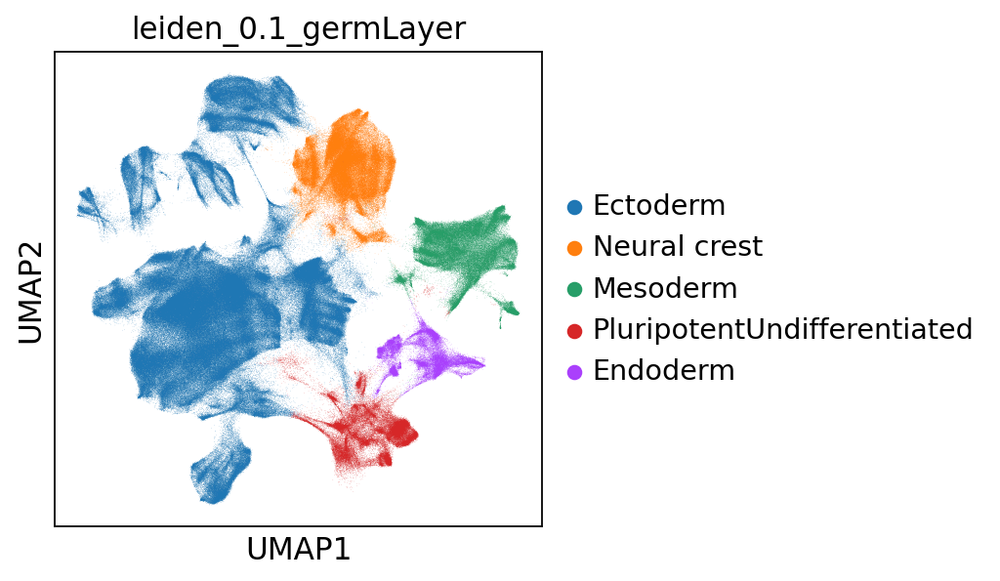

In [4]:
sc.pl.umap(adata, color="leiden_0.1_germLayer")

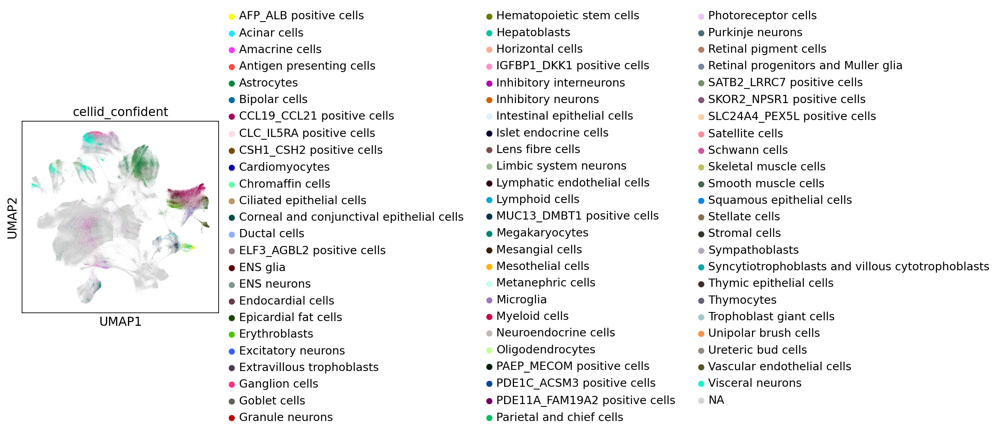

In [6]:
sc.pl.umap(adata, color="cellid_confident")

In [12]:
np.sum(adata.obs['cellid_annotation'].isna())

508804

Want to look specifically at the cardiomyocyte, hepatoblast, and ENS neuron markers

In [8]:
adata.obs['cellid_confident_sub'] = np.where(adata.obs['cellid_confident'].isin(['ENS neurons', 'ENS glia', 'Cardiomyocytes', 
                                                                                 'Epicardial fat cells', 'Hepatoblasts', 
                                                                                'Goblet cells']),
                                             adata.obs['cellid_confident'], np.nan)

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cellid_confident_sub' as categorical
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


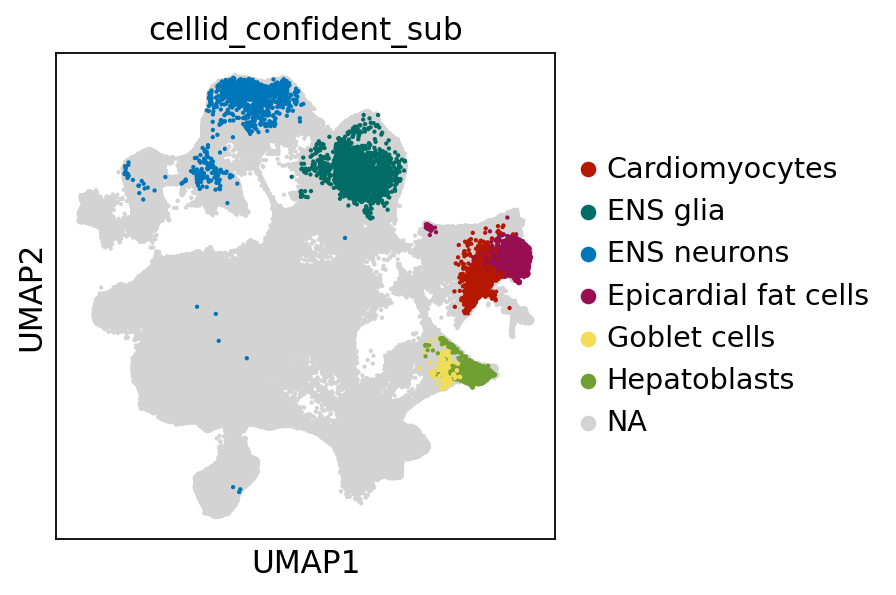

In [9]:
sc.pl.umap(adata, color='cellid_confident_sub', groups=['ENS neurons', 'ENS glia', 'Cardiomyocytes', 'Epicardial fat cells', 'Hepatoblasts', 'Goblet cells'], size=15,
          palette={"Cardiomyocytes": "#B51700", "Epicardial fat cells": "#970E53",
                   "ENS neurons": "#0076BA", "ENS glia": "#006C65",
                   "Hepatoblasts": "#6FA031", "Goblet cells": "#F2DD56"})

In [ ]:
sc.pl.umap(adata, color='cellid_confident_sub', groups=['ENS neurons', 'ENS glia', 'Cardiomyocytes', 'Epicardial fat cells', 'Hepatoblasts', 'Goblet cells'], size=15,
          palette={"Cardiomyocytes": "#B51700", "Epicardial fat cells": "#970E53",
                   "ENS neurons": "#0076BA", "ENS glia": "#006C65",
                   "Hepatoblasts": "#6FA031", "Goblet cells": "#F2DD56"})

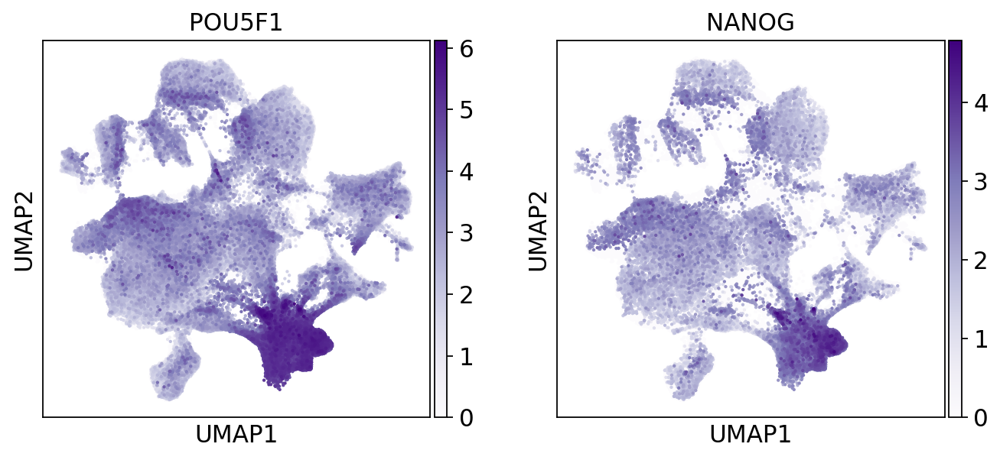

In [42]:
sc.pl.umap(adata, color=['POU5F1', 'NANOG'], size=15, cmap='Purples')

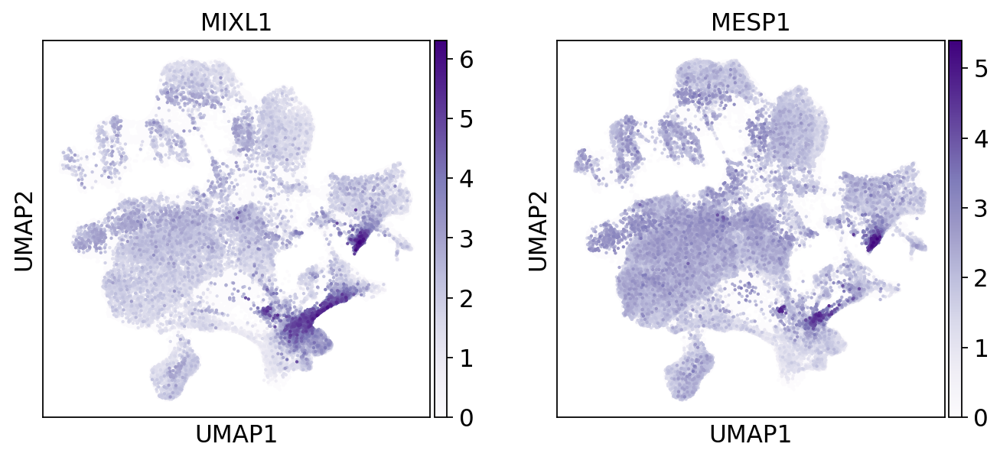

In [43]:
sc.pl.umap(adata, color=['MIXL1', 'MESP1'], size=15, cmap='Purples')

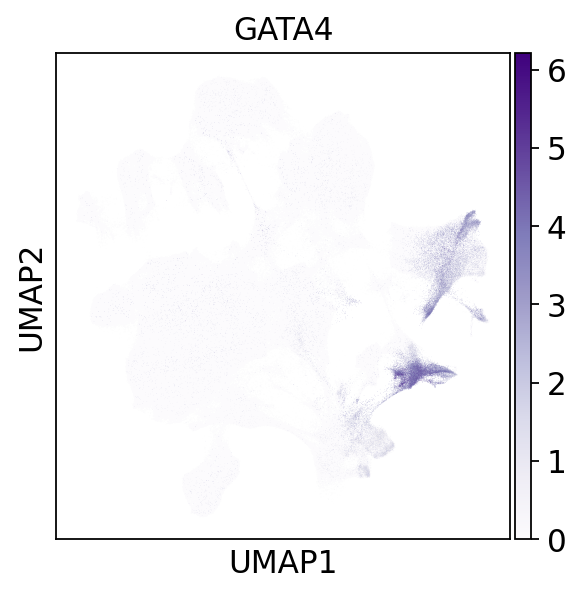

In [44]:
sc.pl.umap(adata, color=['GATA4'], cmap='Purples')

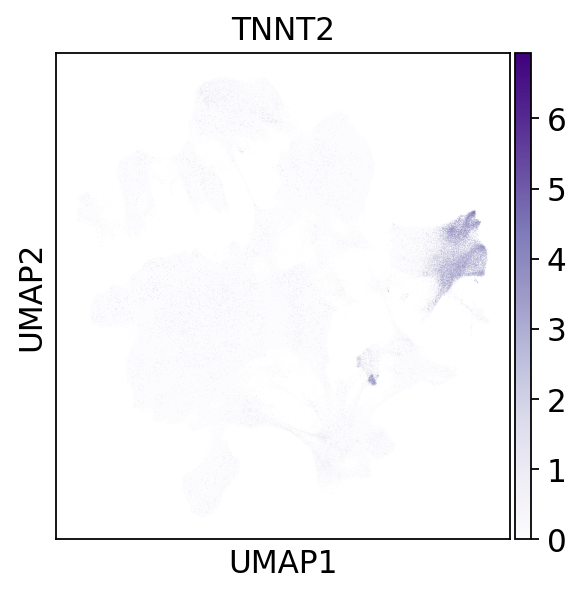

In [45]:
sc.pl.umap(adata, color=['TNNT2'], cmap='Purples')

Let's load the HIPPO clusters for these cells as well

In [4]:
hippo = pd.read_csv("/project2/gilad/ktayeb/ebqtl-workflowr/output/lighthippo/germlayer/lighthippo_summary.tsv", sep="\t", index_col="cell")

In [5]:
hippo = hippo.reindex(adata.obs.index)
hippo

,group,size,k5,k10,k20,k50,k100
cell,,,,,,,
ACAGCCGCATCGGATT-13,Ectoderm_3_of_5,18738,Ectoderm_3_of_5_5,Ectoderm_3_of_5_9,Ectoderm_3_of_5_9,Ectoderm_3_of_5_43,Ectoderm_3_of_5_43
CGAAGTTAGTATCTGC-29,Mesoderm,81738,Mesoderm_2,Mesoderm_8,Mesoderm_8,Mesoderm_8,Mesoderm_78
CCACTTGGTACGTAGG-82,Ectoderm_2_of_5,117926,Ectoderm_2_of_5_2,Ectoderm_2_of_5_2,Ectoderm_2_of_5_2,Ectoderm_2_of_5_22,Ectoderm_2_of_5_22
AGAGAGCCAGCAGGAT-64,Ectoderm_1_of_5,224956,Ectoderm_1_of_5_1,Ectoderm_1_of_5_1,Ectoderm_1_of_5_12,Ectoderm_1_of_5_50,Ectoderm_1_of_5_86
TGTCAGAAGTTGCCTA-55,Ectoderm_5_of_5,158376,Ectoderm_5_of_5_2,Ectoderm_5_of_5_6,Ectoderm_5_of_5_6,Ectoderm_5_of_5_6,Ectoderm_5_of_5_6
...,...,...,...,...,...,...,...
CACGAATAGTATAGGT-99,Ectoderm_1_of_5,224956,Ectoderm_1_of_5_5,Ectoderm_1_of_5_5,Ectoderm_1_of_5_15,Ectoderm_1_of_5_15,Ectoderm_1_of_5_15
TAACACGAGTTGGACG-3,Ectoderm_5_of_5,158376,Ectoderm_5_of_5_4,Ectoderm_5_of_5_4,Ectoderm_5_of_5_4,Ectoderm_5_of_5_33,Ectoderm_5_of_5_66
AGACACTCACATATCG-34,Ectoderm_1_of_5,224956,Ectoderm_1_of_5_1,Ectoderm_1_of_5_1,Ectoderm_1_of_5_17,Ectoderm_1_of_5_17,Ectoderm_1_of_5_17


In [13]:
adata.obs['hippo_group'] = pd.Categorical(hippo['group'])
adata.obs['hippo_k5'] = pd.Categorical(hippo['k5'])
adata.obs['hippo_codes'] = pd.Categorical(adata.obs['hippo_k5'].cat.codes)

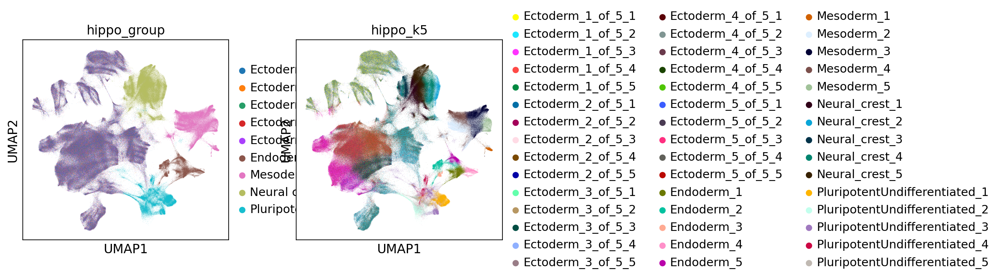

In [14]:
sc.pl.umap(adata, color=["hippo_group", "hippo_k5"])

Create a new palette

In [74]:
custom_palette = sns.color_palette(None, 45)
ipsc_cols = ["#D5D5D5", "#939393", "#454545", "#7F6456", "#5E5339"]
endo_cols = ["#E2980F", "#E2AA0F", "#FEAE00", "#FFD932", "#FFF056"]
meso_cols = ["#FF968D", "#FF644E", "#EE220C", "#C81E00", "#B51700"]
nc_cols = ["#017100", "#1DB100", "#00B52E", "#61D836", "#88FA4E"]

In [75]:
ect1_cols = ["#004D80", "#0076BA", "#116FF7", "#00A2FF", "#56C1FF"]
ect2_cols = ["#006C65", "#009BAB", "#00AB8E", "#16E7CF", "#73FDEA"]

In [83]:
custom_palette[0:4] = ect1_cols
custom_palette[5:9] = ect2_cols
custom_palette[25:29] = endo_cols
custom_palette[30:34] = meso_cols
custom_palette[35:39] = nc_cols
custom_palette[40:44] = ipsc_cols

In [77]:
len(adata.obs['hippo_codes'].cat.categories)

45

In [81]:
custom_palette[0:25] = sns.color_palette("viridis", 50)[:25]

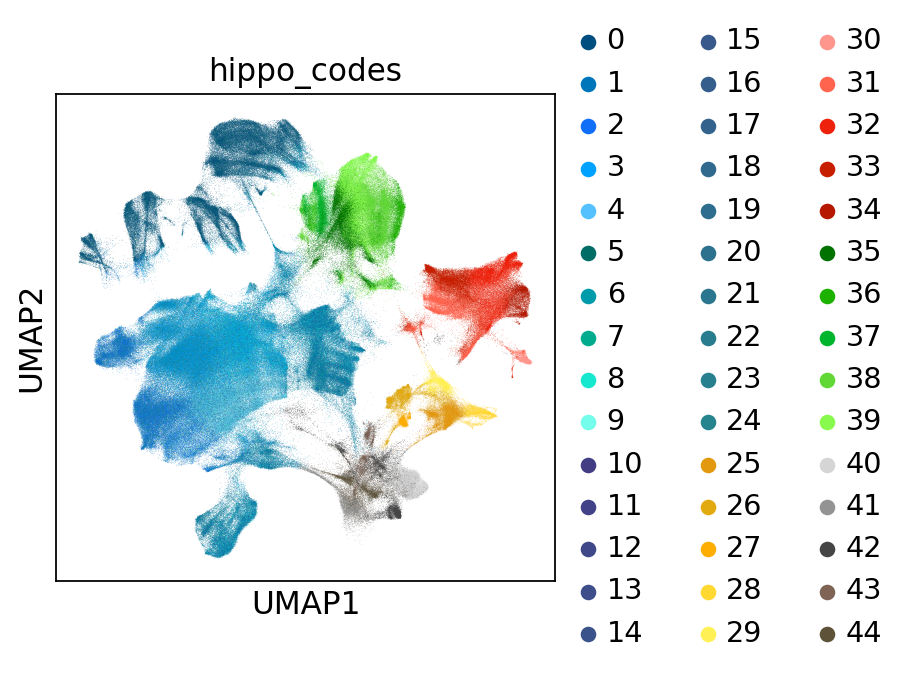

In [84]:
sc.pl.umap(adata, color=['hippo_codes'], palette=custom_palette)

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'hippo_leiden' as categorical


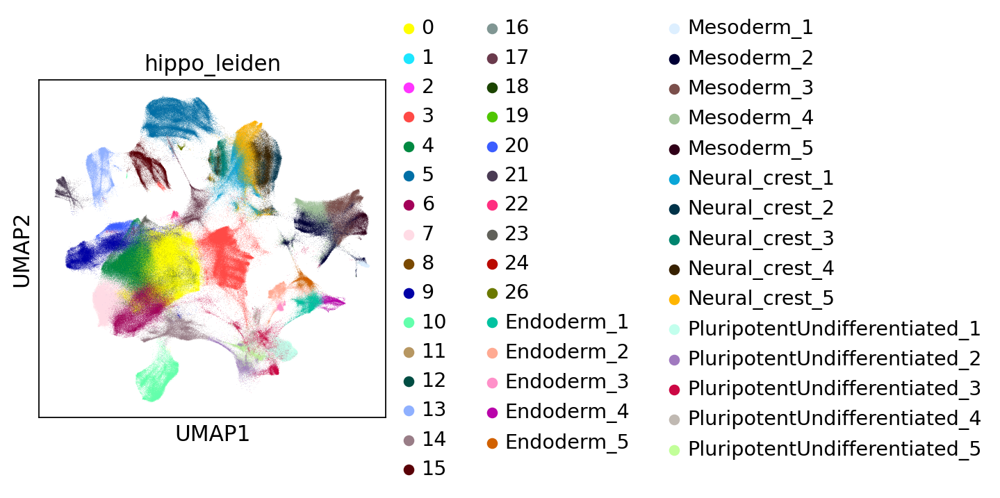

In [46]:
adata.obs['hippo_leiden'] = np.where(adata.obs['leiden_0.1_germLayer'].isin(["Ectoderm", "Neural Crest"]), adata.obs['leiden_scVI_0.5'], adata.obs['hippo_k5'])
sc.pl.umap(adata, color="hippo_leiden")

Next, try to get a color map that shows these hippo clusters as a reflection of their germ layers

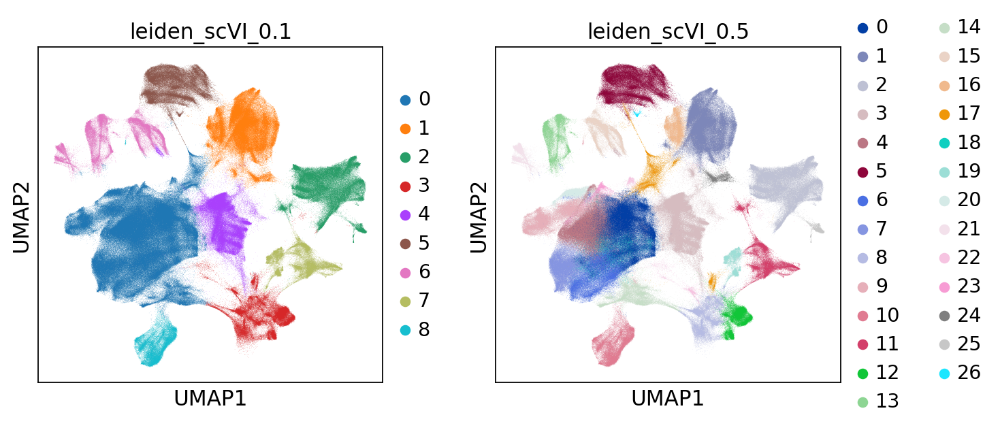

In [15]:
sc.pl.umap(adata, color=['leiden_scVI_0.1', 'leiden_scVI_0.5'])

## PAGA Analysis

Low resolution - germ layer assignments

In [16]:
sc.tl.paga(adata, groups="leiden_0.1_germLayer")

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:33)


--> added 'pos', the PAGA positions (adata.uns['paga'])


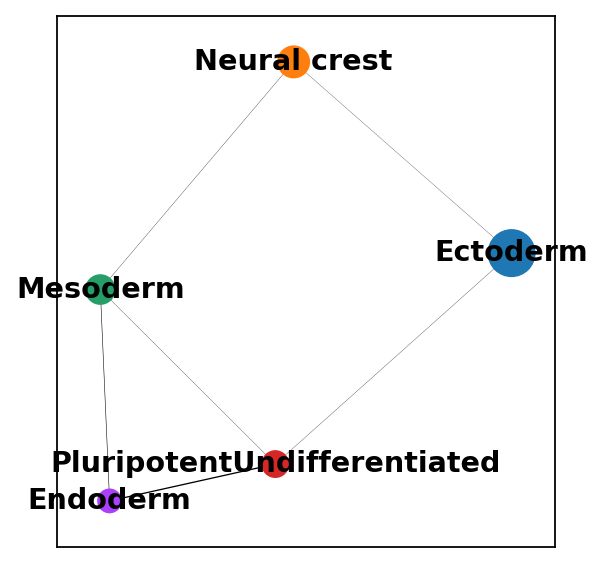

In [19]:
sc.pl.paga(adata)

Higher resolution - using HIPPO clusters

In [89]:
sc.tl.paga(adata, groups="hippo_k5")

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:01:04)


In [91]:
code2clust = dict(enumerate(adata.obs['hippo_k5'].cat.categories))

--> added 'pos', the PAGA positions (adata.uns['paga'])


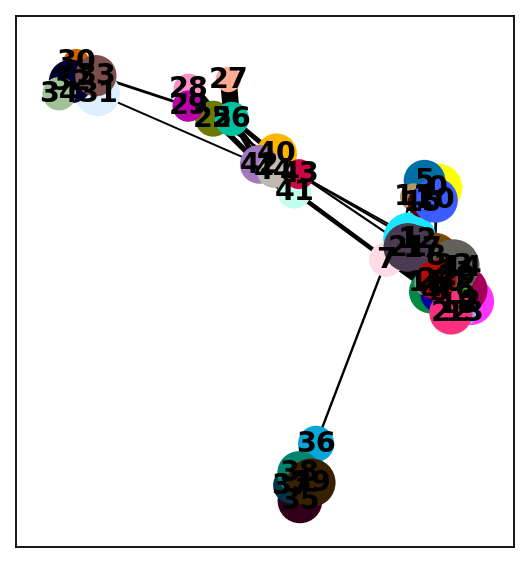

In [103]:
sc.pl.paga(adata, color='hippo_k5', threshold=0.1, labels=code2clust, cmap=custom_palette, node_size_scale=2.0)

In [95]:
adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cellid_annotated_paga.h5ad")

## Geometric Sketching to Preserve Transition States

In [22]:
ncells=50000
dimred = adata.obsm['X_scVI']
sketch_index = geosketch.gs(dimred, ncells, replace=False)

In [23]:
adata_sketch = adata[sketch_index]

In [24]:
adata_sketch.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cellid_annotated_sketch.h5ad")

/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
/scratch/midway2/jpopp/.conda/envs/scvi-scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1236: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'hippo_group' as categorical


In [123]:
adata_sketch = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/highpass/cellid_annotated_sketch.h5ad")

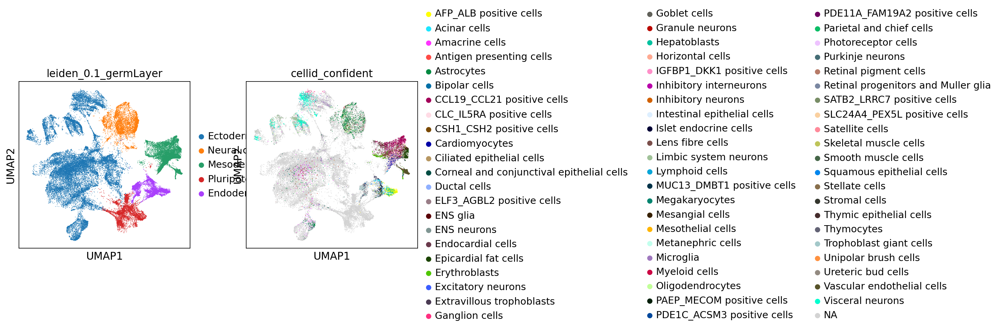

In [124]:
sc.pl.umap(adata_sketch, color=["leiden_0.1_germLayer", "cellid_confident"])

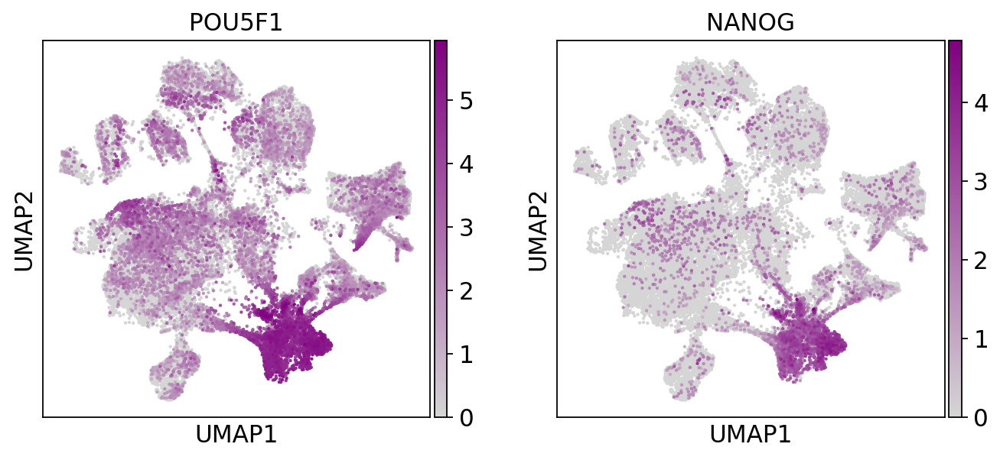

In [37]:
sc.pl.umap(adata_sketch, color=["POU5F1", "NANOG"], size=15, 
           cmap=matplotlib.colors.LinearSegmentedColormap.from_list("", ["#D5D5D5", "purple"]), 
           use_raw=False)

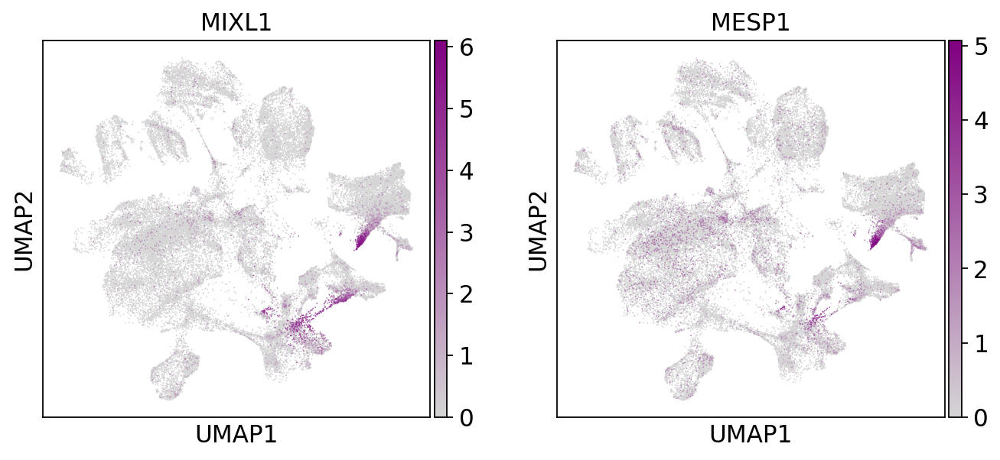

In [38]:
sc.pl.umap(adata_sketch, color=["MIXL1", "MESP1"], cmap=cmap)

In [20]:
adata_sketch.obs

,sample_id,Collection.Date,Lane,Sample.ID,cDNA.amp.cycles,cDNA.total.yield,library.prep.batch,Sequencing.batch,col.group,donor_id_x,...,leiden_scVI_0.5,leiden_scVI_0.1,ind_rep,donor_id_y,cellid_annotation,leiden_0.1_annotation,leiden_0.1_germLayer,cellid_confident,hippo_group,hippo_k5
cell,,,,,,,,,,,,,,,,,,,,,
GATGATCTCATGAGAA-22,1015_2,10/15/2020,2,101520_2,11.0,1257.68,3,3,101520,NA18520,...,9,0,NA18520_1.0,NA18520,NaN,EarlyEctoderm_neuroepithelium,Ectoderm,NaN,Ectoderm_2_of_5,ect_2_2
GCGATCGAGGTCGCCT-67,1105_4,11/5/2020,4,110520_4,11.0,378.10,5,7,110520,NA19102,...,5,5,NA19102_2.0,NA19102,NaN,tentative_DevelopingSensoryGanglia,Ectoderm,NaN,Ectoderm_5_of_5,ect_5_1
CTAACCCTCGAACGGA-67,1105_4,11/5/2020,4,110520_4,11.0,378.10,5,7,110520,NA18508,...,21,6,NA18508_1.0,NA18508,NaN,PostMitoticNeurons,Ectoderm,NaN,Ectoderm_2_of_5,ect_2_1
TTATTGCCACTACGGC-17,1012_3,10/12/2020,3,101220_3,11.0,368.93,2,2,101220,NA19210,...,8,3,NA19210_1.0,NA19210,NaN,PluripotentUndifferentiated,PluripotentUndifferentiated,NaN,PluripotentUndifferentiated,ipsc_2
TCAATCTGTACGACAG-20,1012_6,10/12/2020,6,101220_6,11.0,396.79,2,2,101220,NA18912,...,8,3,NA18912_1.0,NA18912,NaN,PluripotentUndifferentiated,PluripotentUndifferentiated,NaN,PluripotentUndifferentiated,ipsc_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGCCTGGTCGGCTAC-107,0816_6,8/16/2019,6,081619_6,NaN,NaN,P1,P1,81619,NA18511,...,10,8,NA18511_1.0,NA18511,Photoreceptor cells,tentative_developingEye,Ectoderm,Photoreceptor cells,Ectoderm_5_of_5,ect_5_2
CTCATCGTCTAGCAAC-23,1015_3,10/15/2020,3,101520_3,11.0,1662.24,3,3,101520,NA18856,...,3,4,NA18856_1.0,NA18856,Erythroblasts,tentative_neuralTube,Ectoderm,NaN,Ectoderm_1_of_5,ect_1_2
GATTTCTGTATGGTAA-101,1214_2,12/14/2020,2,121420_2,11.0,482.12,7,10,121420,NA19119,...,0,0,NA19119_2.0,NA19119,NaN,EarlyEctoderm_neuroepithelium,Ectoderm,NaN,Ectoderm_5_of_5,ect_5_5


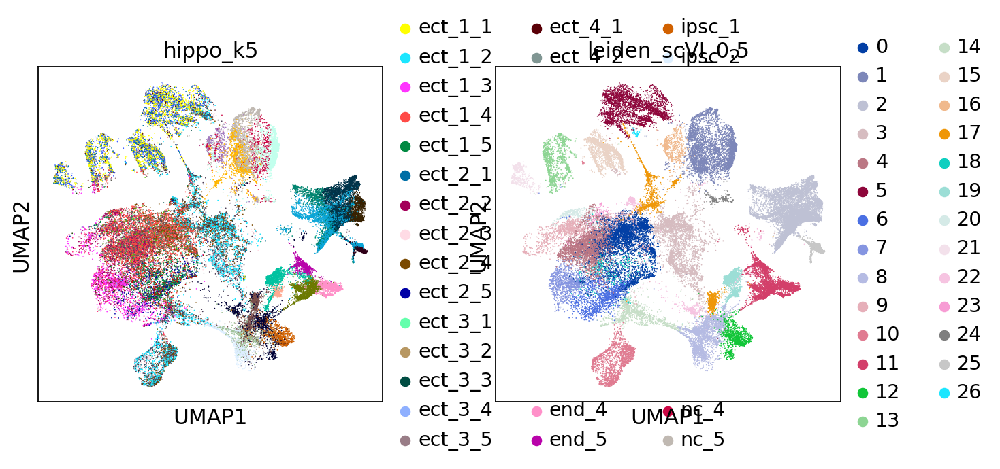

In [34]:
sc.pl.umap(adata_sketch, color=['hippo_k5', 'leiden_scVI_0.5'])

In [5]:
sc.pp.neighbors(adata_sketch, use_rep="X_scVI")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)


In [28]:
sc.tl.paga(adata_sketch, groups="hippo_k5")

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:03)


In [30]:
code2clust = dict(enumerate(adata_sketch.obs['hippo_k5'].cat.categories))

--> added 'pos', the PAGA positions (adata.uns['paga'])


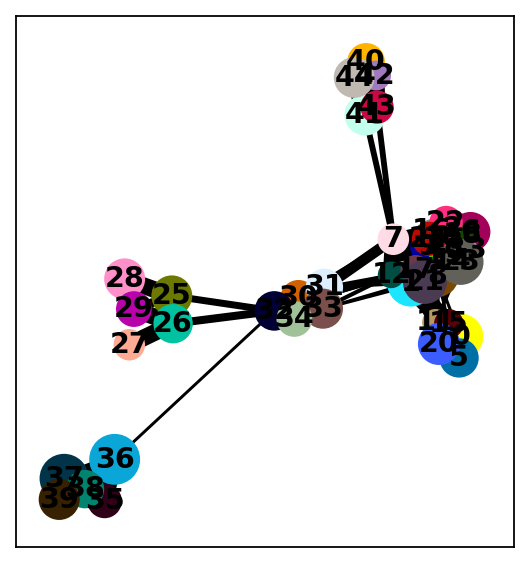

In [33]:
sc.pl.paga(adata_sketch, threshold = 0.175, labels=code2clust, node_size_scale=2)

In [38]:
sc.tl.draw_graph(adata_sketch, init_pos="paga")

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:09:28)


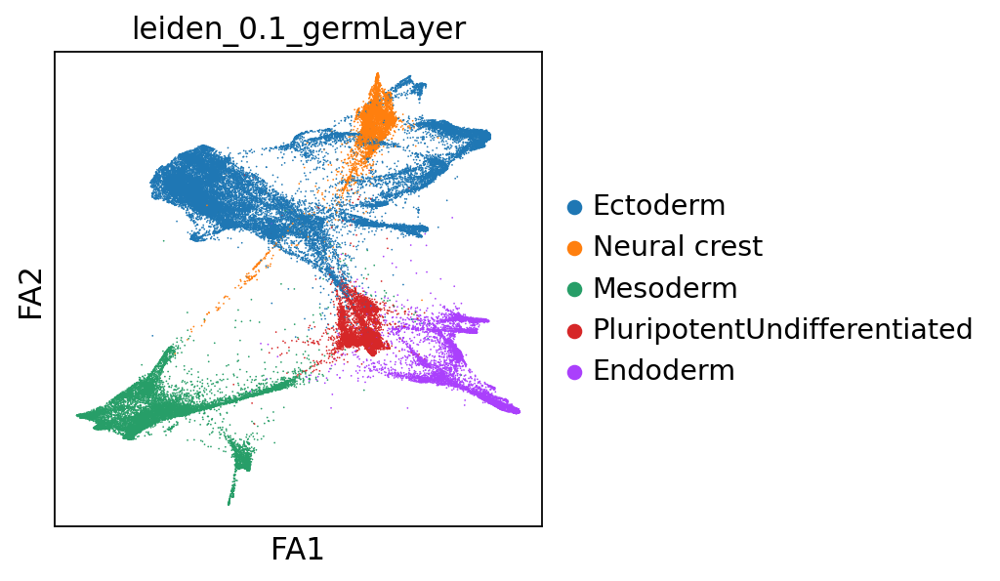

In [39]:
sc.pl.draw_graph(adata_sketch, color='leiden_0.1_germLayer')

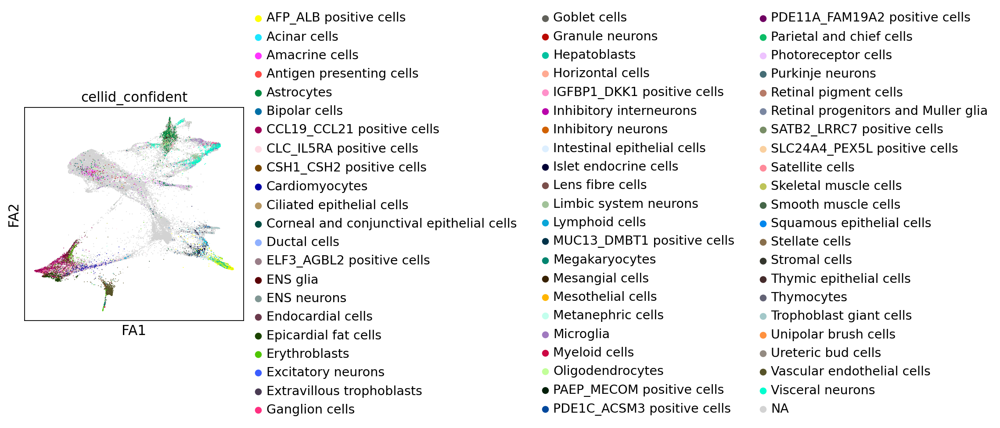

In [40]:
sc.pl.draw_graph(adata_sketch, color=['cellid_confident'])

## Single lineage isolation

In [46]:
mesendo = adata[adata.obs['leiden_0.1_germLayer'].isin(['PluripotentUndifferentiated', 'Endoderm', 'Mesoderm'])]

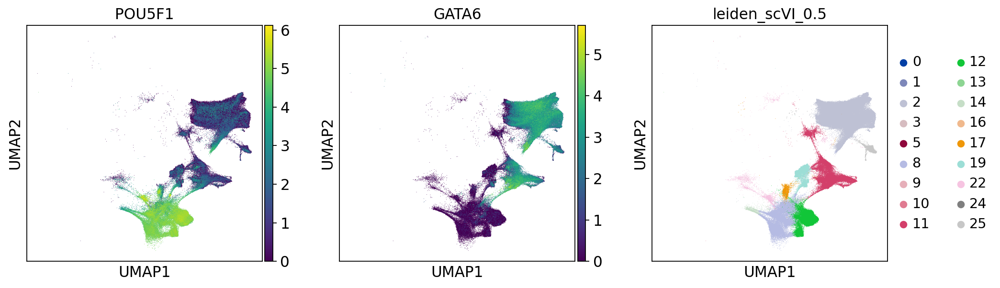

In [74]:
sc.pl.umap(mesendo, color=['POU5F1', 'GATA6', 'leiden_scVI_0.5'])

In [48]:
sc.pp.neighbors(mesendo, use_rep="X_scVI")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:49)


In [57]:
sc.tl.diffmap(endo)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.998065   0.9954533  0.99063647 0.9897878  0.9881058
     0.9843054  0.9828719  0.98207915 0.97866803 0.97547346 0.97414654
     0.9720048  0.97189206 0.9711766 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:08)


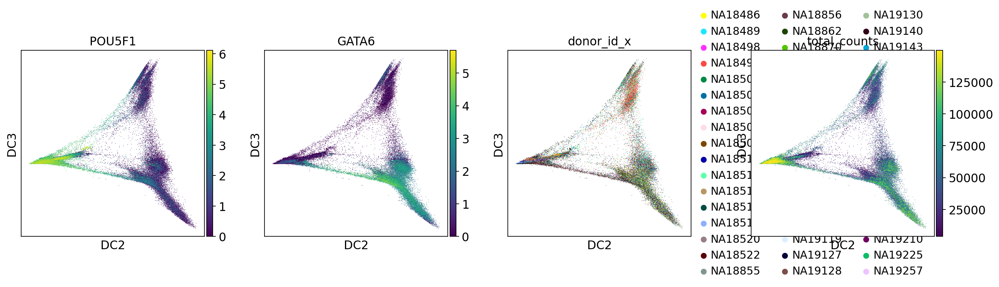

In [70]:
sc.pl.diffmap(endo, dimensions=[(1,2)], color=['POU5F1', 'GATA6', 'donor_id_x', 'total_counts'])

In [66]:
list(endo.obs.columns)

['sample_id',
 'Collection.Date',
 'Lane',
 'Sample.ID',
 'cDNA.amp.cycles',
 'cDNA.total.yield',
 'library.prep.batch',
 'Sequencing.batch',
 'col.group',
 'donor_id_x',
 'prob_max',
 'prob_doublet',
 'n_vars',
 'best_singlet',
 'best_doublet',
 'doublet_logLikRatio',
 'Line.True',
 'Line.StockLabel',
 'contaminated',
 'swapped',
 'Feeder.passage',
 'Feeder.Free.passage',
 'sex',
 'Formation.replicate',
 'collection.replicate',
 'formation.date',
 'visual.confluence',
 'total.cells.per.lane..correct.',
 'X..Viable..based.on.average.of.two.counts.',
 'days.maintained.in.LD.prior.to.formation',
 'who.dissociated.the.lines.for.formation',
 'cell.counter.correction',
 'comments',
 'collection.date',
 'collection.group.label',
 'EB.appearance.notes',
 'dissociated.by.',
 'approx..time.in.accumax..in.minutes.',
 'n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 '_scvi_batch',
 '_scvi_labels',
 '_scvi_local_l_mean',
 '_scvi_local_l_var',
 'Z_0',
 'Z_1',
 'Z_2',
 'Z